<a href="https://colab.research.google.com/github/rvear/machine-learning/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip"/content/drive/MyDrive/dog vision/dog-breed-identification .zip" -d"drive/MyDrive/dog vision/"

/bin/bash: line 1: unzip/content/drive/MyDrive/dog vision/dog-breed-identification .zip: No such file or directory


In [ ]:
#importing the tensorflow
import tensorflow as tf
print("tf version:",tf.__version__)

tf version: 2.15.0


In [ ]:
#import tensorflow_hub
import tensorflow_hub as hub

In [ ]:
#check for GPU avalaibility
print("gpu","available(yess) "  if tf.config.list_physical_devices("gpu") else "not available:(")

gpu not available:(


##getting our data ready(turning into Tensors)

In [ ]:
#checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

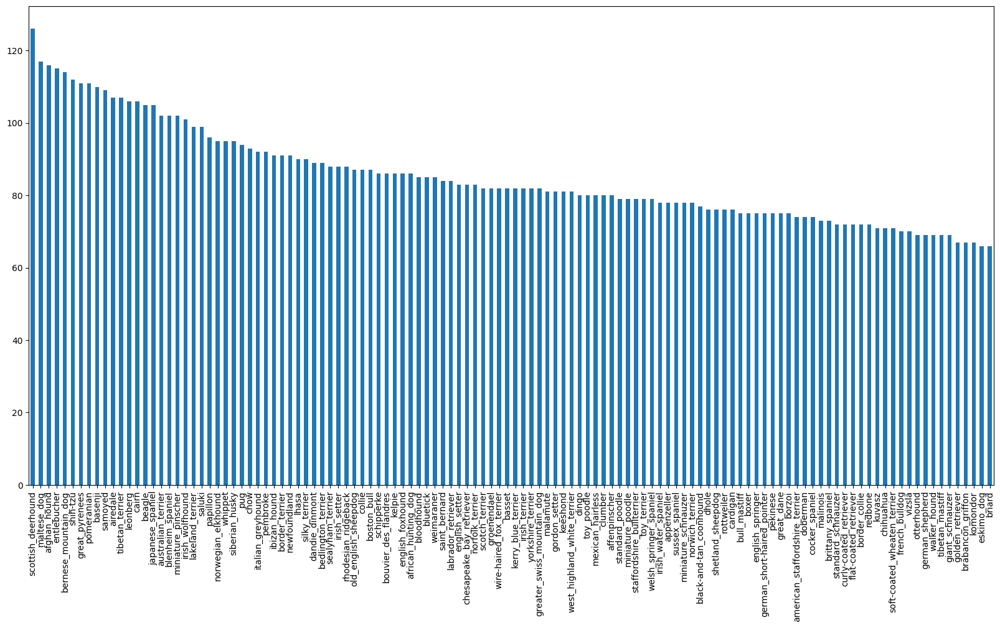

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

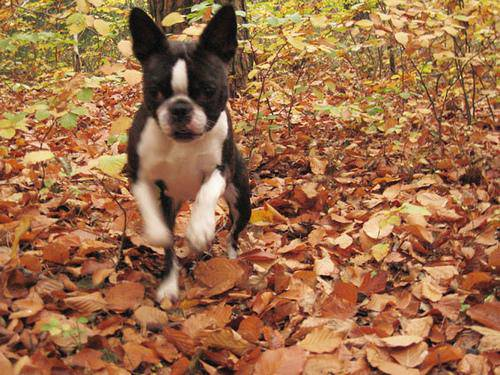

In [ ]:
#viewing an image for example
from IPython.display import Image
Image("/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## getting images and their labels

In [ ]:
# creating  pathname from image ID's
filenames =["/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/"+fname+".jpg" for fname in labels_csv["id"]]

# cheking the first 10
filenames[:10]

['/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped File

In [ ]:
# cheking whether number of filenames matches to the actual trainig set files
import os
if len(os.listdir("/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/"))==len(filenames):
  print("all good")

all good


In [ ]:
from PIL import Image

In [ ]:
labels_csv["id"][9000]

'e20e32bf114141e20a1af854ca4d0ecc'

In [ ]:
import numpy as np

labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels)==len(filenames):
  print("matches")
else:
    print("do not matches")

matches


In [ ]:
#finding the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#Turning  a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turning  a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Example turning boolean arrat into integers
print(labels[0])#original label
print(np.where(unique_breeds==labels[0]))#index where label occurs
print(boolean_labels[0].argmax())#index where label occurs in boolean array
print(boolean_labels[0].astype(int))#there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#setup x and y variables
x=filenames
y=boolean_labels

In [ ]:
#seting  number of images to use for experimenting
NUM_IMAGES=1000 #@param{type: "slider",min:1000,max:10000,step:1000}

In [ ]:
#let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)
#split them into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
#let's have a geez at the training data
x_train[:2],y_train[:2]

(['/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip (Unzipped Files)/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,

preprocessing images into tensors

In [ ]:
#convert image to Numpu array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape


(257, 350, 3)

In [ ]:
image.max()

255

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
tensor=tf.io.read_file(filenames[16])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x00\xd4\x01v\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
#seting a fix size for images
IMG_SIZE=224


#creating a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  #read in an image file
  image=tf.io.read_file(image_path)
  #Turn the jpeg image into numerical tensor with 3 color channels (red,green,blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert the color channels values from 0-255 to 0-1
  image =tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value(224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
tensor=tf.image.decode_jpeg(tensor,channels=3)

In [ ]:
tf.image.convert_image_dtype(tensor,tf.float32)

<tf.Tensor: shape=(212, 374, 3), dtype=float32, numpy=
array([[[0.        , 0.2392157 , 0.45882356],
        [0.        , 0.24705884, 0.47450984],
        [0.        , 0.2509804 , 0.5019608 ],
        ...,
        [0.09019608, 0.21960786, 0.35686275],
        [0.07450981, 0.20392159, 0.34117648],
        [0.07450981, 0.20392159, 0.34117648]],

       [[0.        , 0.24313727, 0.454902  ],
        [0.        , 0.24313727, 0.4666667 ],
        [0.00784314, 0.24705884, 0.49411768],
        ...,
        [0.00784314, 0.12156864, 0.24705884],
        [0.        , 0.09411766, 0.21960786],
        [0.        , 0.10588236, 0.23137257]],

       [[0.00392157, 0.24313727, 0.454902  ],
        [0.00392157, 0.24313727, 0.45882356],
        [0.01176471, 0.24313727, 0.4784314 ],
        ...,
        [0.        , 0.04705883, 0.14509805],
        [0.        , 0.01960784, 0.11764707],
        [0.        , 0.03137255, 0.12941177]],

       ...,

       [[0.1137255 , 0.22352943, 0.41960788],
        [0.11

## turning our data into small batches


In [ ]:

#creating a simple function to return a tuple(images,label)
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
train_labels_new=train_labels*1
train_labels_new

NameError: name 'train_labels' is not defined

In [ ]:
#demo of the above function
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
#define the batch size ,32
BATCH_SIZE=32
#creating a function to turn data into batches
def create_data_batches(x,y=None, batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  #if the data is a test dataset,althoug we do not have but in case
  if test_data:
    print("creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    #if the data is a valid dataset ,we don't need to shuffle it
  elif valid_data:
      print("creating validation data batches")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
      data_batch=data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

  else:
      print("creating trainig data batches")
      #turn filepaths and labels into tensors
      data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
      #shuffling pathnames and labels before mapping image processor function is faster than shuffling images
      data=data.shuffle(buffer_size=len(x))
      #create (image,label) tuples (this also turns path into a preprocessed image)
      data=data.map(get_image_label)
      #Turn the training data into batches
      data_batch=data.batch(BATCH_SIZE)

      return data_batch


In [ ]:
#create training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating trainig data batches
creating validation data batches


In [ ]:
#checking out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches
our data is now in batches

In [ ]:
import matplotlib.pyplot as plt


In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images,labels):
  # setup the figure
  plt.figure(figsize=(15,20))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots (5 rows,5 columns)
    ax=plt.subplot(5, 5, i+1)
    #display an image
    plt.imshow(images[i])
    #add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    #plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels_new=next(train_data.as_numpy_iterator())
train_images,train_labels_new

(array([[[[7.64705956e-01, 5.88235319e-01, 4.74509835e-01],
          [7.61029482e-01, 5.84558845e-01, 4.63480413e-01],
          [7.56862819e-01, 5.75980425e-01, 4.56617683e-01],
          ...,
          [9.51849222e-01, 9.04545307e-01, 8.44006121e-01],
          [9.80637312e-01, 9.88970637e-01, 9.34803963e-01],
          [9.73529458e-01, 1.00000000e+00, 9.59558904e-01]],
 
         [[7.64705956e-01, 5.88235319e-01, 4.74509835e-01],
          [7.61029482e-01, 5.84558845e-01, 4.63480413e-01],
          [7.56862819e-01, 5.75980425e-01, 4.56617683e-01],
          ...,
          [9.56773102e-01, 9.09469187e-01, 8.48930001e-01],
          [9.80637312e-01, 9.92089093e-01, 9.28567111e-01],
          [9.73529458e-01, 1.00000000e+00, 9.54166710e-01]],
 
         [[7.64705956e-01, 5.88235319e-01, 4.74509835e-01],
          [7.61029482e-01, 5.84558845e-01, 4.63480413e-01],
          [7.56862819e-01, 5.75980425e-01, 4.56617683e-01],
          ...,
          [9.52341616e-01, 9.03321981e-01, 8.4792

In [ ]:
len(train_images),len(train_labels_new)

(32, 32)

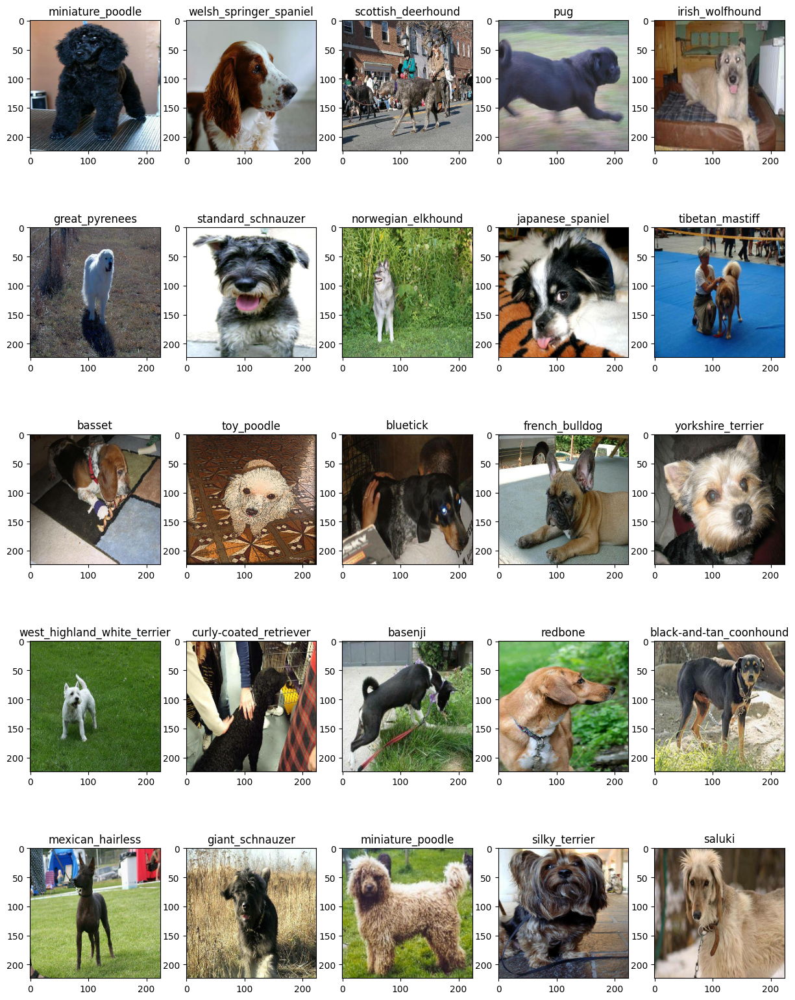

In [ ]:
#visualizing the data in a training batch
show_25_images(train_images,train_labels_new)

In [ ]:
train_labels_new*1


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

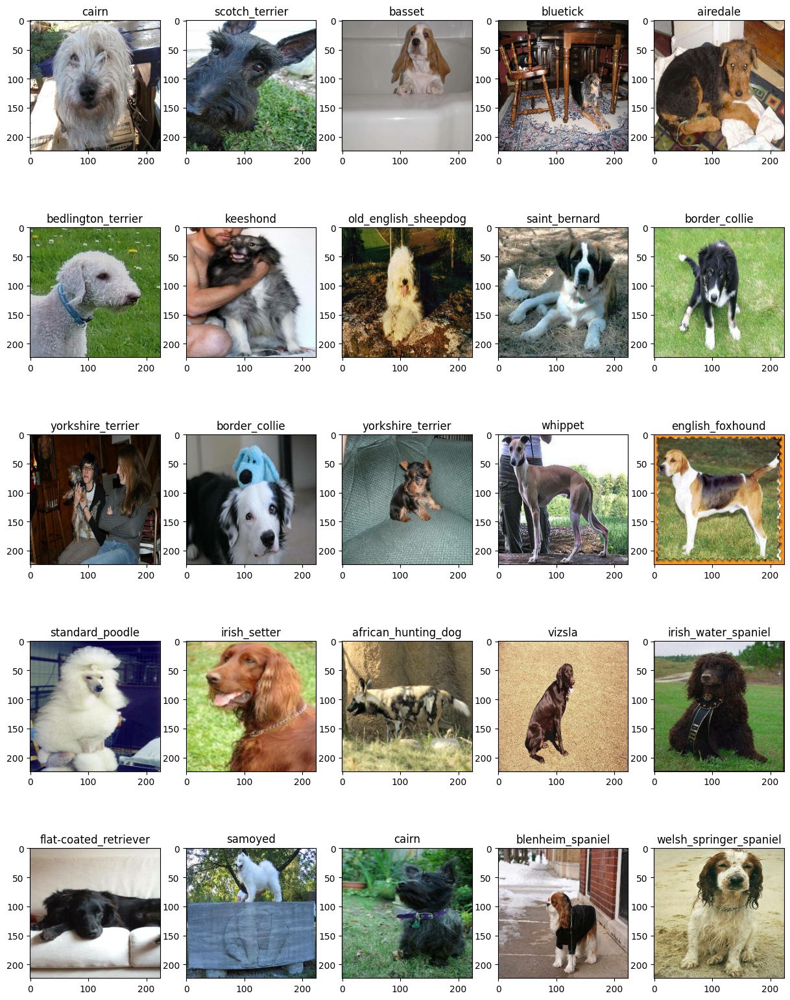

In [ ]:
#now let's visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model


In [ ]:
#setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]#batch,height,width,colour channels

#setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#setup model URL form TensorFlow Hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"


In [ ]:
#creating a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("building model withL:",MODEL_URL)

 #setup the model layers
  model=tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), #layer 1 (input layer)
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax")#layer 2(output layer)

 ])
 #compile the model
  model.compile(
     loss=tf.keras.losses.CategoricalCrossentropy(),
     optimizer=tf.keras.optimizers.Adam(),
     metrics=["accuracy"]
 )
 #build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model=create_model()
model.summary()

building model withL: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
#load TensorBoard notebook extension
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

#create a fucntion to build a tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/dog vision/logfiles",
                      #make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
#creating earlu stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

#training the model

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
#build a function to train and return a trained model
def train_model():
  #create a model
  model=create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model


In [ ]:
#fit the model to the data
model=train_model()

building model withL: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 10s 190ms/step - loss: 4.5746 - accuracy: 0.1000 - val_loss: 3.4108 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 171ms/step - loss: 1.6368 - accuracy: 0.6875 - val_loss: 2.1716 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 5s 184ms/step - loss: 0.5681 - accuracy: 0.9312 - val_loss: 1.6879 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2553 - accuracy: 0.9850 - val_loss: 1.5198 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 4s 170ms/step - loss: 0.1466 - accuracy: 0.9987 - val_loss: 1.4347 - val_accuracy: 0.5950
Epoch 6/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1009 - accuracy: 0.9987 - val_loss: 1.3854 - val_accuracy: 0.6200
E

In [ ]:
##checking the tensorboard logs
%tensorboard --logdir /content/drive/MyDrive/dog\ vision/logfiles

Reusing TensorBoard on port 6006 (pid 4245), started 0:34:20 ago. (Use '!kill 4245' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#make predictions on the validation data(not used to train on )
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 37s 111ms/step


array([[2.0236711e-03, 6.8255336e-05, 3.9931131e-04, ..., 3.9264001e-04,
        3.4243680e-05, 2.0437143e-03],
       [7.1490777e-04, 4.6029928e-04, 4.0713110e-04, ..., 1.2160532e-05,
        6.7834253e-04, 6.5363936e-05],
       [2.5195275e-06, 2.6969699e-05, 1.2686867e-05, ..., 8.7638336e-06,
        4.8981929e-06, 4.9713417e-05],
       ...,
       [1.2603853e-06, 1.4465596e-04, 4.3314136e-05, ..., 4.4231006e-06,
        1.8957035e-04, 1.0940250e-04],
       [7.9226382e-03, 4.7819802e-04, 1.0784614e-04, ..., 5.4975626e-05,
        2.8869423e-05, 3.5841262e-03],
       [1.5949681e-04, 1.4969612e-06, 1.5846227e-03, ..., 2.5064065e-03,
        6.3197792e-04, 7.0053320e-05]], dtype=float32)

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[0]

array([2.02367106e-03, 6.82553364e-05, 3.99311306e-04, 3.41349078e-05,
       5.82335779e-05, 1.25128927e-05, 2.87946034e-02, 4.02274454e-04,
       1.85313802e-05, 5.31010446e-04, 3.90022353e-04, 1.09759778e-04,
       1.02702051e-03, 5.27057673e-05, 4.86155972e-04, 3.27340123e-04,
       3.66586937e-05, 1.47749841e-01, 2.91241049e-05, 7.67858946e-05,
       7.45525933e-04, 3.68961279e-04, 2.60755260e-05, 5.84463298e-04,
       1.10261797e-04, 1.30354456e-04, 1.05558105e-01, 2.04476615e-04,
       7.70121405e-05, 4.14601149e-04, 9.61157421e-05, 3.98398982e-03,
       8.68046540e-04, 2.63149013e-05, 3.13605960e-05, 2.57684346e-02,
       3.99271841e-04, 1.49709536e-04, 3.87470616e-04, 7.61173214e-05,
       2.41628406e-03, 4.58977192e-05, 3.29291579e-05, 2.04267493e-03,
       8.80457956e-05, 6.99267621e-05, 7.50899562e-05, 4.54698056e-05,
       2.77994433e-04, 8.97460035e-04, 2.18253175e-04, 1.22500249e-04,
       3.04200046e-04, 8.41148139e-05, 8.33441809e-05, 1.25463805e-04,
      

In [ ]:
#First prediction
index=4
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"sum:{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[4.0091675e-07 2.4569274e-06 5.3522467e-07 9.9624497e-01 6.2243248e-07
 7.0279420e-06 5.5578848e-06 3.9487754e-06 2.0768912e-06 3.0483096e-07
 1.5724978e-06 9.7461252e-06 4.3502197e-04 1.3085828e-06 6.1080086e-06
 6.2829408e-06 1.4706999e-06 4.5976474e-05 3.3364374e-06 7.9114166e-08
 3.0491342e-06 2.0112957e-06 1.2571503e-06 1.7901019e-06 1.0566472e-05
 1.0781789e-06 7.4461241e-07 8.2649899e-07 1.0586561e-04 2.2693667e-08
 8.4249205e-06 1.5131039e-07 8.6651353e-06 7.9748434e-06 3.0068171e-05
 6.3033127e-07 9.5217638e-06 8.7606786e-05 5.4682596e-06 2.6291234e-05
 1.9933563e-07 4.7501626e-06 1.3362408e-05 1.5253212e-06 5.1608555e-07
 4.7545342e-07 3.7044669e-05 1.7707793e-08 5.4000902e-06 8.3322966e-06
 1.6881440e-05 4.2604086e-07 1.3153430e-06 3.2954792e-06 3.4634681e-06
 8.3897658e-07 7.8511199e-05 7.6180972e-05 1.9278168e-06 6.0797938e-06
 3.8857243e-06 1.8849838e-07 3.7268507e-07 1.0844270e-06 1.1738297e-06
 2.7075937e-06 3.7061880e-05 5.0683720e-05 5.8008957e-04 1.9711206e-06
 6.433

In [ ]:
unique_breeds[3]

'airedale'

In [ ]:
#turn prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[4])
pred_label

'airedale'

In [ ]:
unique_breeds[4]

'american_staffordshire_terrier'

In [ ]:
images_ =[]
labels_ =[]
#loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

  images_[0],labels_[0]

In [ ]:
#creating a function to unbatch a batch dataset
def unbatchify(data):
  images= []
  labels =[]
  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
    return images,labels

    #unbatchify the validation data
    val_images,val_labels=unbatchify(val_data)
    val_images[0], val_labels[0]

In [ ]:
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  #getting the pred label
  pred_label=get_pred_label(pred_prob)
  #plotting image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])


  #change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                      )

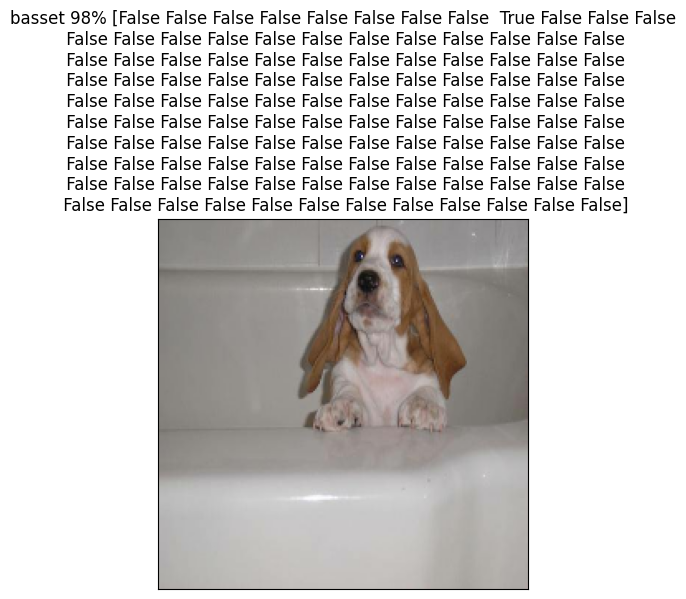

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=2)

In [ ]:
def plot_pred_cong(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #getting the predicted label
  pred_label=get_pred_label(pred_prob)
  #finding the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #finding the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #finding the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


In [ ]:
predictions[0]

array([2.02367106e-03, 6.82553364e-05, 3.99311306e-04, 3.41349078e-05,
       5.82335779e-05, 1.25128927e-05, 2.87946034e-02, 4.02274454e-04,
       1.85313802e-05, 5.31010446e-04, 3.90022353e-04, 1.09759778e-04,
       1.02702051e-03, 5.27057673e-05, 4.86155972e-04, 3.27340123e-04,
       3.66586937e-05, 1.47749841e-01, 2.91241049e-05, 7.67858946e-05,
       7.45525933e-04, 3.68961279e-04, 2.60755260e-05, 5.84463298e-04,
       1.10261797e-04, 1.30354456e-04, 1.05558105e-01, 2.04476615e-04,
       7.70121405e-05, 4.14601149e-04, 9.61157421e-05, 3.98398982e-03,
       8.68046540e-04, 2.63149013e-05, 3.13605960e-05, 2.57684346e-02,
       3.99271841e-04, 1.49709536e-04, 3.87470616e-04, 7.61173214e-05,
       2.41628406e-03, 4.58977192e-05, 3.29291579e-05, 2.04267493e-03,
       8.80457956e-05, 6.99267621e-05, 7.50899562e-05, 4.54698056e-05,
       2.77994433e-04, 8.97460035e-04, 2.18253175e-04, 1.22500249e-04,
       3.04200046e-04, 8.41148139e-05, 8.33441809e-05, 1.25463805e-04,
      

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.14774984, 0.1055581 , 0.09968366, 0.08522494, 0.08257514,
       0.0717178 , 0.06165401, 0.05651134, 0.04370597, 0.04221149],
      dtype=float32)

In [ ]:
predictions[0].max()

0.14774984

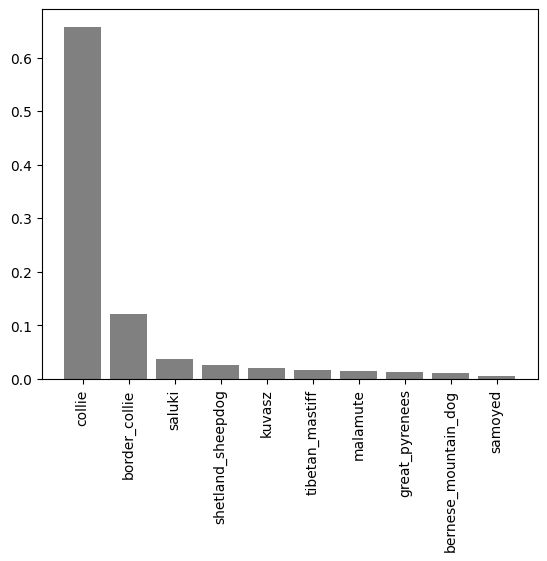

In [ ]:
plot_pred_cong(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

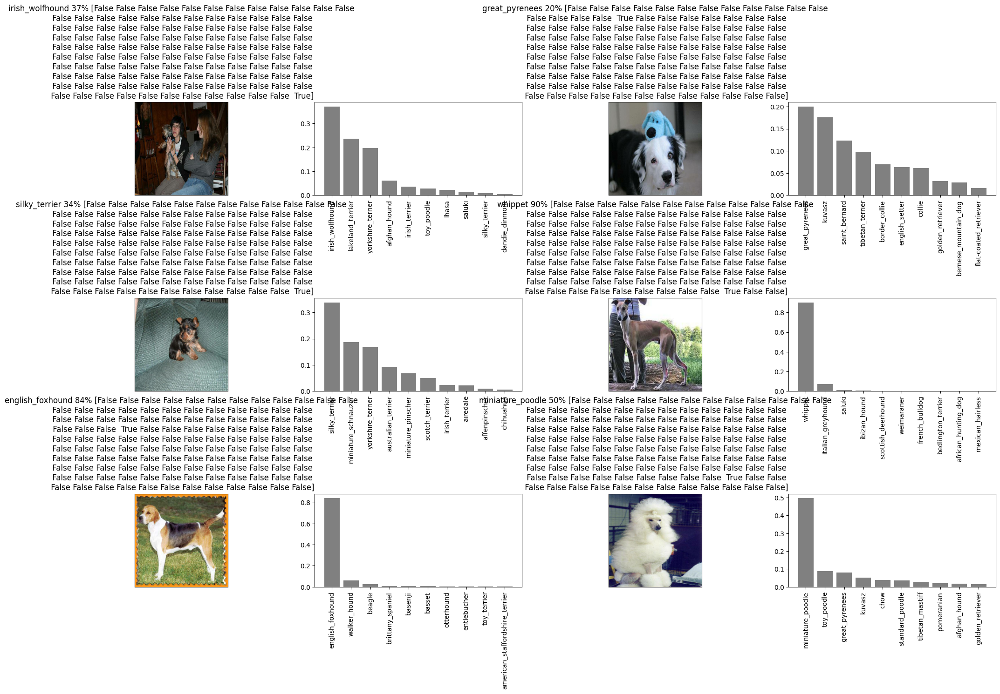

In [ ]:
#let's check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_cong(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## saving and loading our model

In [ ]:
#creating a function to save a model
def save_model(model,suffix=None):
  #create a model directory pathname with current time
  modeldir=os.path.join("/content/drive/MyDrive/dog vision/Models",
                        datetime.datetime.now().strftime("%y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix +".h5"
  print(f"saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):

  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

saving model to:/content/drive/MyDrive/dog vision/Models/240217-14361708180614-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dog vision/Models/240217-14361708180614-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#Load a trained model
loaded_1000_image_model=load_model("/content/drive/MyDrive/dog vision/Models/240217-14361708180614-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/dog vision/Models/240217-14361708180614-1000-images-mobilenetv2-Adam.h5


In [ ]:
#evaluating the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 103ms/step - loss: 1.2138 - accuracy: 0.6900


[1.2137854099273682, 0.6899999976158142]

In [ ]:
#evaluating the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.2138 - accuracy: 0.6900


[1.2137854099273682, 0.6899999976158142]

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
#creating a data batch with the full data set
full_data=create_data_batches(x,y)

creating trainig data batches


In [ ]:
full_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model for full model
full_model=create_model()

building model withL: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
#create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set when training on all the data,so we can't monitor validation accuracy
full_model_early_stopping =tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

In [ ]:
#fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
#load in the full model
loaded_full_model=load_model("")

In [ ]:
#load test image filenames
test_path=""
test_filenames=[test_path + fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
#create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

In [ ]:
#Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

In [ ]:
#save prediction (numpy array ) to csv file (for access later)
np.savetxt("drive/MyDrive/dog vision/preds_array.csv",delimiter=" ")

In [ ]:
#load predictions (Numpy array ) from csv file
test_predictions=np.loadtxt("",delimiter=",")